# Unsupervised Algorithms Homework

In this homework assignment, you will apply three fundamental machine learning algorithms to famous datasets:
1. **K-Means clustering**: Customer Segmentation with Retail Dataset
2. **Heirarchical clustering**:Wine Dataset Classification

### Instructions

- Implement **at least** one algorithm
- Complete each section carefully
- Add your code where indicated by `# YOUR CODE HERE`
- Provide comments explaining your approach

In [3]:
#!pip install openpyxl

  Obtaining dependency information for openpyxl from https://files.pythonhosted.org/packages/c0/da/977ded879c29cbd04de313843e76868e6e13408a94ed6b987245dc7c8506/openpyxl-3.1.5-py2.py3-none-any.whl.metadata
  Obtaining dependency information for et-xmlfile from https://files.pythonhosted.org/packages/c1/8b/5fe2cc11fee489817272089c4203e679c63b570a5aaeb18d852ae3cbba6a/et_xmlfile-2.0.0-py3-none-any.whl.metadata
   ---------------------------------------- 0.0/250.9 kB ? eta -:--:--
   --------- ------------------------------ 61.4/250.9 kB 1.7 MB/s eta 0:00:01
   ---------------------------------------- 250.9/250.9 kB 3.9 MB/s eta 0:00:00



[notice] A new release of pip is available: 23.2.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [1]:
# Import required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

# Machine Learning Libraries
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.cluster import KMeans, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# Set random seed for reproducibility
np.random.seed(42)

## Part 1: K-Means Clustering - Customer Segmentation

#### Tasks
1. Load and preprocess the dataset
2. Perform feature engineering
3. Apply K-Means clustering
4. Visualize and interpret customer segments

In [4]:
# Load the dataset
retail_data = pd.read_excel('Online Retail.xlsx', engine='openpyxl')
retail_data.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


In [6]:
retail_data.describe()

,Quantity,InvoiceDate,UnitPrice,CustomerID
count,541909.000000,541909,541909.000000,406829.000000
mean,9.552250,2011-07-04 13:34:57.156386048,4.611114,15287.690570
min,-80995.000000,2010-12-01 08:26:00,-11062.060000,12346.000000
25%,1.000000,2011-03-28 11:34:00,1.250000,13953.000000
50%,3.000000,2011-07-19 17:17:00,2.080000,15152.000000
75%,10.000000,2011-10-19 11:27:00,4.130000,16791.000000
max,80995.000000,2011-12-09 12:50:00,38970.000000,18287.000000
std,218.081158,NaN,96.759853,1713.600303


In [7]:
print(retail_data.isna().sum())

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64


In [25]:
# TODO: Data Preprocessing
# 1. Remove rows with missing values
# 2. Remove negative quantities and zero prices
# 3. Use only Quantity and UnitPrice for the clustering

# YOUR CODE HERE:
df = retail_data.copy()
df=df.dropna()

df= df[(df['Quantity']>0) & (df['UnitPrice']>0)]

X = df[['Quantity','UnitPrice']]
X

,Quantity,UnitPrice
0,6,2.55
1,6,3.39
2,8,2.75
3,6,3.39
4,6,3.39
...,...,...
541904,12,0.85
541905,6,2.10
541906,4,4.15
541907,4,4.15


In [26]:
# TODO: Visualise points of dataset
# YOUR CODE HERE:

# Convert to a DataFrame
# Create scatter plot
fig = px.scatter(X, x='Quantity', y='UnitPrice', title='Online Retail')
fig.show()

In [27]:
# TODO: Scale the features

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

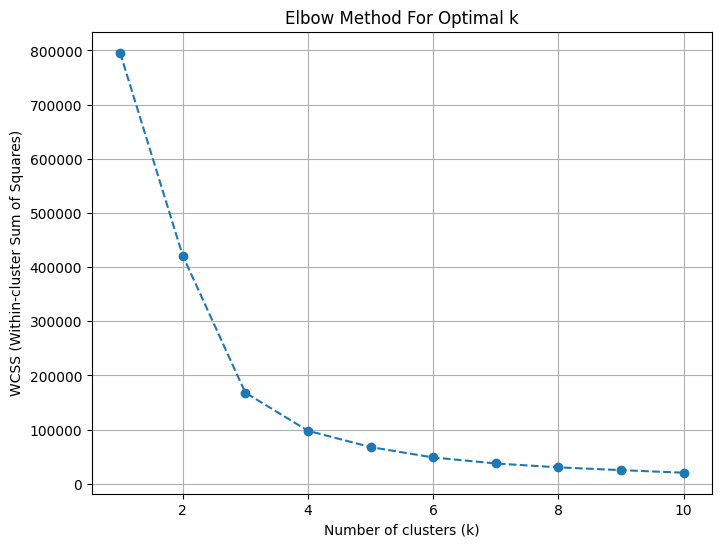

In [28]:
# TODO: Perform K-Means Clustering

# Initialize an empty list to store the WCSS values
wcss = []

# Try different values of k (from 1 to 10)
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=42)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)  # inertia_ is the WCSS value

# Plot the WCSS vs the number of clusters (k)
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of clusters (k)')
plt.ylabel('WCSS (Within-cluster Sum of Squares)')
plt.grid(True)
plt.show()

In [42]:
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans_labels = kmeans.fit_predict(X_scaled)

In [43]:
kmeans.cluster_centers_

array([[-2.17146990e-03, -5.75545906e-03],
       [ 4.32673514e+02, -7.04361662e-02],
       [-6.68495745e-02,  3.68345062e+02],
       [-6.68495745e-02,  9.60834254e+01]])

In [44]:
kmeans_labels

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

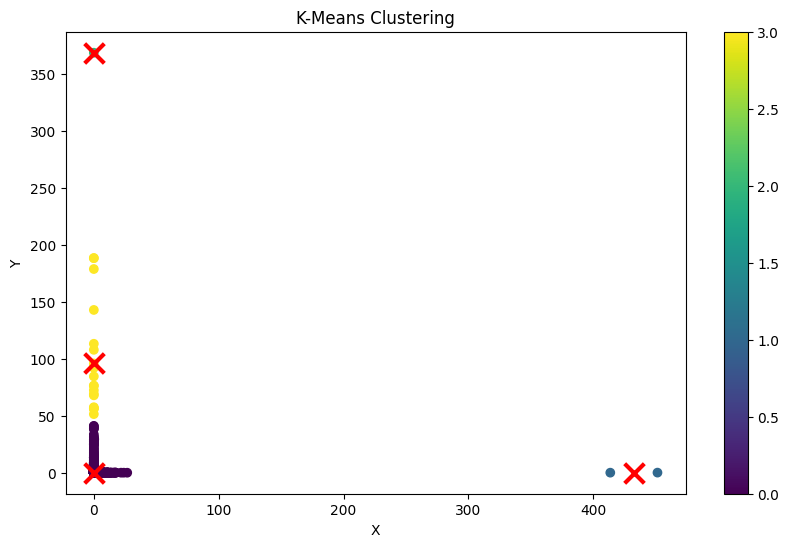

In [45]:
# TODO: Visualise dataset with assign clusters

plt.figure(figsize=(10, 6))
scatter = plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=kmeans_labels, cmap='viridis')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='x', color='red', s=200, linewidths=3)
plt.title('K-Means Clustering')
plt.xlabel('X')
plt.ylabel('Y')
plt.colorbar(scatter)
plt.show()

## Part 2: Hierarchical Clustering - Wine Dataset Classification

#### Tasks
1. Load Wine dataset
2. Preprocess and scale features
3. Perform Hierarchical Clustering
4. Visualize dendrogram and cluster results

In [33]:
# Load Wine Dataset

from sklearn.datasets import load_wine

wine = load_wine()
X_wine = pd.DataFrame(wine.data, columns=wine.feature_names)

In [34]:
X_wine

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95.0,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740.0
174,13.40,3.91,2.48,23.0,102.0,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750.0
175,13.27,4.28,2.26,20.0,120.0,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835.0
176,13.17,2.59,2.37,20.0,120.0,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840.0


In [46]:
X_wine.isna().sum()

alcohol                         0
malic_acid                      0
ash                             0
alcalinity_of_ash               0
magnesium                       0
total_phenols                   0
flavanoids                      0
nonflavanoid_phenols            0
proanthocyanins                 0
color_intensity                 0
hue                             0
od280/od315_of_diluted_wines    0
proline                         0
dtype: int64

In [48]:
# TODO: Preprocess the data
# 1. Scale the features using StandardScaler
# 2. Ensure no missing values

scaler = StandardScaler()
X_hier_scaled = scaler.fit_transform(X_wine)

In [49]:
# TODO: Compute linkage matrix for Hierarchical Clustering. Use different linkage methods. Try: 'ward', 'complete', 'average'
linkage_matrix = linkage(X_hier_scaled, method='ward')

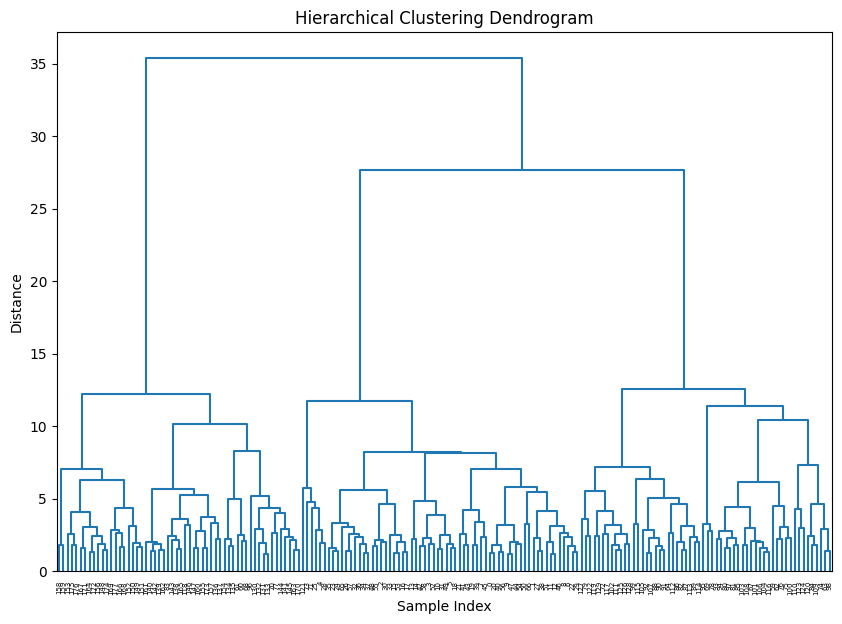

In [50]:
# TODO: Plot dendrogram

plt.figure(figsize=(10, 7))
dendrogram(linkage_matrix, color_threshold=0)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

In [81]:
#sceglierei il teglio a 3 perchè suddivide con distanze più simili il dataset
#nel taglio a 2 sono poco selettivo, raggruppo valori che sono molto distanti tra loro (cl2-3)
#nel taglio a 4 dovrebbe suddividere il cl3 nei due rami sottostanti... non mi sembra necessario 

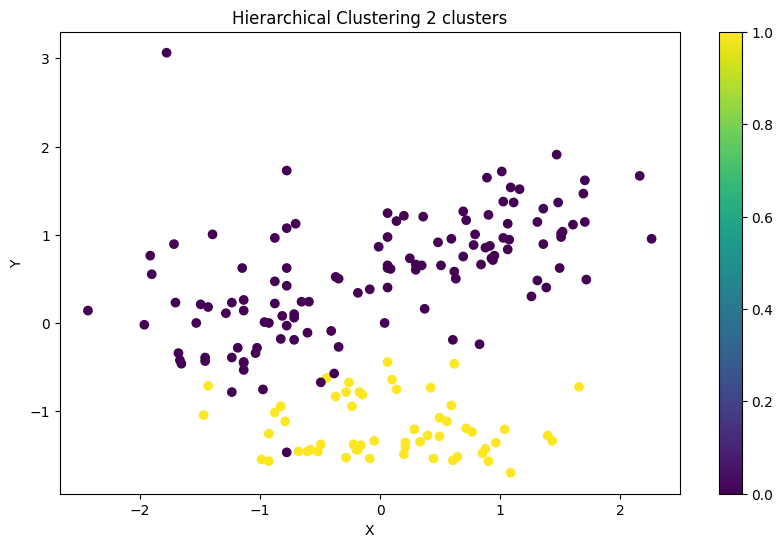

In [75]:
# TODO: Perform Hierarchical Clustering. Try different number of clusters: 2, 3 and 4 clusters. 
# Visualization of Clustering Results on 2 variables on your choice.

# YOUR CODE HERE:
# Perform Hierarchical Clustering
hier_cluster = AgglomerativeClustering(n_clusters=2) #, linkage = 'complete'
hier_labels = hier_cluster.fit_predict(X_hier_scaled) 

# Visualization
plt.figure(figsize=(10, 6))
scatter = plt.scatter(X_hier_scaled[:, 0], X_hier_scaled[:, 6], c=hier_labels, cmap='viridis')
plt.title('Hierarchical Clustering 2 clusters')
plt.xlabel('X')
plt.ylabel('Y')
plt.colorbar(scatter)
plt.show()

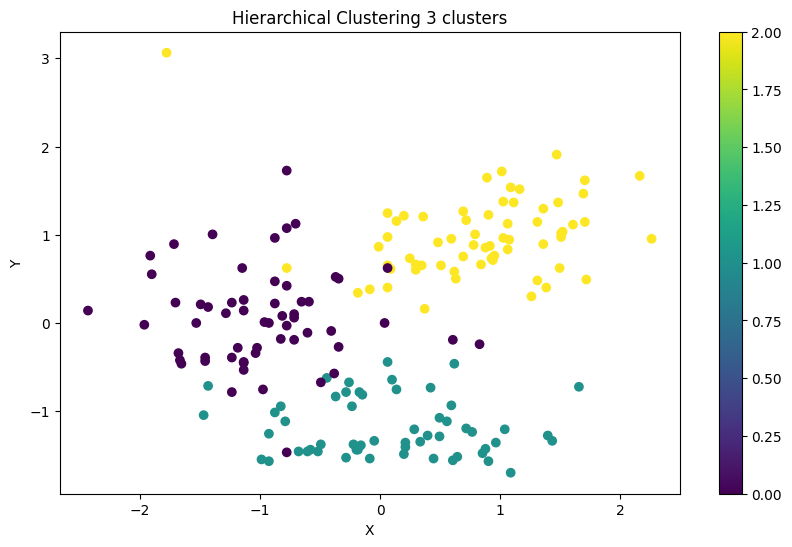

In [74]:
# YOUR CODE HERE:
# Perform Hierarchical Clustering
hier_cluster = AgglomerativeClustering(n_clusters=3)
hier_labels = hier_cluster.fit_predict(X_hier_scaled)

# Visualization
plt.figure(figsize=(10, 6))
scatter = plt.scatter(X_hier_scaled[:, 0], X_hier_scaled[:, 6], c=hier_labels, cmap='viridis')
plt.title('Hierarchical Clustering 3 clusters')
plt.xlabel('X')
plt.ylabel('Y')
plt.colorbar(scatter)
plt.show()

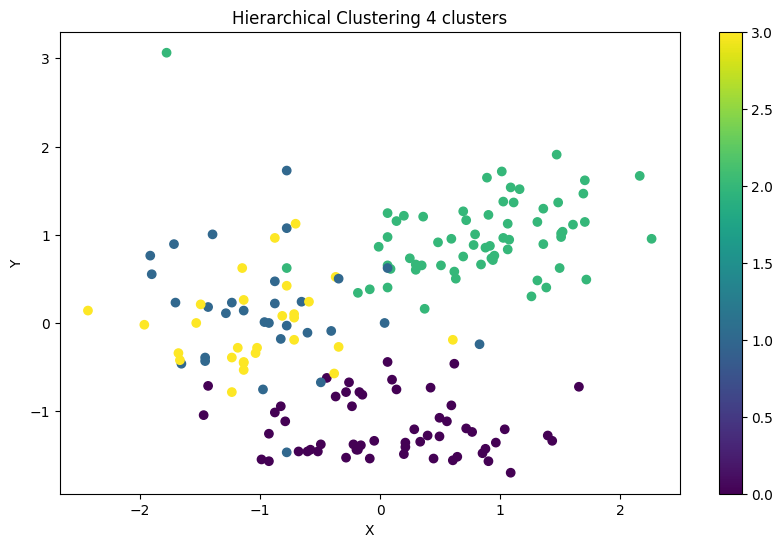

In [80]:
# YOUR CODE HERE:
# Perform Hierarchical Clustering
hier_cluster = AgglomerativeClustering(n_clusters=4)
hier_labels = hier_cluster.fit_predict(X_hier_scaled)

# Visualization
plt.figure(figsize=(10, 6))
scatter = plt.scatter(X_hier_scaled[:, 0], X_hier_scaled[:, 6], c=hier_labels, cmap='viridis')
plt.title('Hierarchical Clustering 4 clusters')
plt.xlabel('X')
plt.ylabel('Y')
plt.colorbar(scatter)
plt.show()